In [30]:
import numpy as np
from matplotlib import pyplot as plt
plt.style.use("default")
import pandas as pd
import seaborn as sns
import cryolo_cbox_utils
from pathlib import Path
import mrcfile

In [2]:
def read_rows_txt_file(txt_file):
    with open(txt_file, mode="r") as f:
        rows = [float(row) for row in f]
    return rows

In [3]:
confidence = read_rows_txt_file("/home/simon/gpu-rechner_u3_mount/crYOLO_picking/20220307_GPCR_nanodisk_Simon-crYOLO_picking/training_with_self_picked_locs_on_denoised/output_boxes/DISTR/confidence_distribution_raw_20220926-135727.txt")
size = read_rows_txt_file("/home/simon/gpu-rechner_u3_mount/crYOLO_picking/20220307_GPCR_nanodisk_Simon-crYOLO_picking/training_with_self_picked_locs_on_denoised/output_boxes/DISTR/size_distribution_raw_20220926-135727.txt")


In [4]:
confidence = np.array(confidence)
size = np.array(size)

In [5]:
confidence

array([0.62, 0.3 , 0.41, ..., 0.12, 0.25, 0.14])

In [6]:
size

array([210., 205., 205., ..., 205., 207., 206.])

In [7]:
cryolo_df = pd.DataFrame(
    data = {
        "Confidence": confidence,
        "Size": size
    }
)
cryolo_df

,Confidence,Size
0,0.62,210.0
1,0.30,205.0
2,0.41,205.0
3,0.27,207.0
4,0.32,206.0
...,...,...
1007168,0.55,209.0
1007169,0.39,208.0
1007170,0.12,205.0
1007171,0.25,207.0


In [8]:
cryolo_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1007173 entries, 0 to 1007172
Data columns (total 2 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   Confidence  1007173 non-null  float64
 1   Size        1007173 non-null  float64
dtypes: float64(2)
memory usage: 15.4 MB


In [9]:
threshold = 0.3
cryolo_df["Accepted"] = cryolo_df["Confidence"] > threshold
cryolo_df

,Confidence,Size,Accepted
0,0.62,210.0,True
1,0.30,205.0,False
2,0.41,205.0,True
3,0.27,207.0,False
4,0.32,206.0,True
...,...,...,...
1007168,0.55,209.0,True
1007169,0.39,208.0,True
1007170,0.12,205.0,False
1007171,0.25,207.0,False


In [10]:
import matplotlib
matplotlib.__version__

'3.5.1'

In [11]:
sns.__version__

'0.11.2'

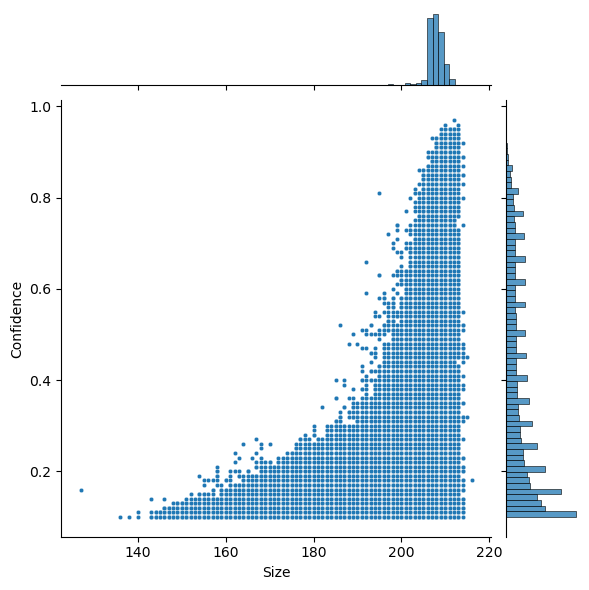

In [12]:
bin_num = 70
sns.jointplot(
    data=cryolo_df, x="Size", y="Confidence", s=10,
    marginal_kws=dict(bins=bin_num)
)

<AxesSubplot:xlabel='Size', ylabel='Confidence'>

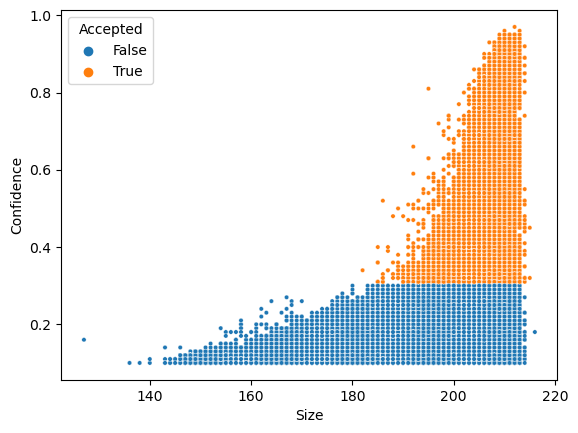

In [13]:
sns.scatterplot(data=cryolo_df, x="Size", y="Confidence", hue="Accepted", s=10)

Text(0.5, 0, 'particle size [px] (70 bins)')

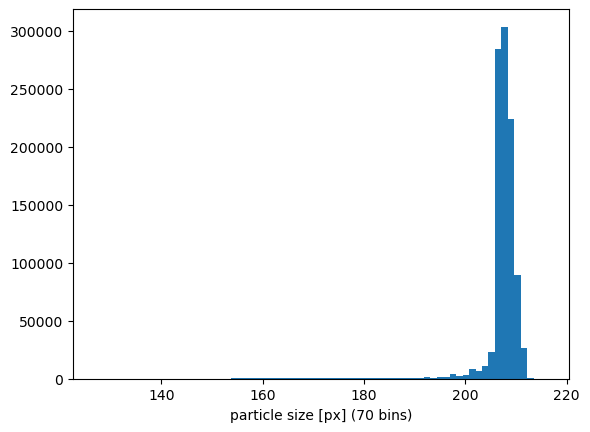

In [14]:
bin_num = 70
plt.hist(size, bins=bin_num)
plt.xlabel(f"particle size [px] ({bin_num} bins)")

(array([278710., 158568., 114470.,  85523.,  87752.,  84845.,  75083.,
         76352.,  41798.,   4072.]),
 array([0.1  , 0.187, 0.274, 0.361, 0.448, 0.535, 0.622, 0.709, 0.796,
        0.883, 0.97 ]),
 <BarContainer object of 10 artists>)

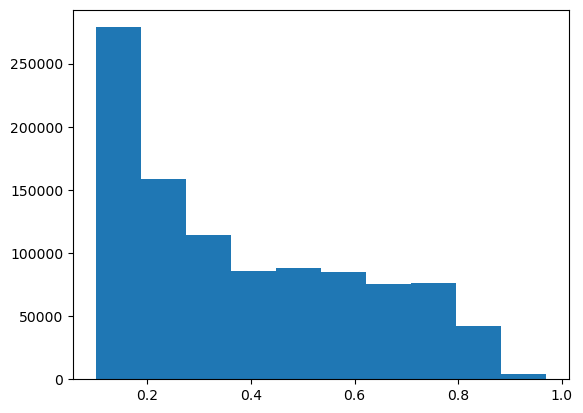

In [15]:
plt.hist(confidence)

## Read particle .cbox files:

In [16]:
particle_cbox_dir_path = Path("/home/simon/gpu-rechner_u3_mount/crYOLO_picking/20220307_GPCR_nanodisk_Simon-crYOLO_picking/training_with_self_picked_locs_on_denoised/output_boxes/CBOX")
assert particle_cbox_dir_path.exists() and particle_cbox_dir_path.is_dir()

## Create ONE Dataframe with all particles from all images

In [17]:
data_frames = []
mic_id_to_micrograph = {}
id = 0
for cbox_file in particle_cbox_dir_path.glob("*.cbox"):
    per_image_particles_df = cryolo_cbox_utils.parse_new_cbox_format(cbox_file)

    # add Micrograph name as column variable. The values are taken from the .cbox file name (bzw. stem):
    mic_name = cbox_file.stem
    per_image_particles_df["Micrograph"] = [mic_name] * len(per_image_particles_df)
    per_image_particles_df["Mic_ID"] = id

    mic_id_to_micrograph[id] = mic_name

    data_frames.append(per_image_particles_df)
    id += 1

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> E

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_Coordinat

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_Coordinate

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Dept

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Dept

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> Coor

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> Coord

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle


/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] 

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle


/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_Coordinat

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> Coor

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> Coor

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df


['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Dep

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Dept

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> EstWidth
['_EstHeight', '#8'] -> EstHeight
['_Confidence', '#9'] -> Confidence
['_NumBoxes', '#10'] -> NumBoxes
['_Angle', '#11'] -> Angle
Column names detected:
['_CoordinateX', '#1'] -> CoordinateX
['_CoordinateY', '#2'] -> CoordinateY
['_CoordinateZ', '#3'] -> CoordinateZ
['_Width', '#4'] -> Width
['_Height', '#5'] -> Height
['_Depth', '#6'] -> Depth
['_EstWidth', '#7'] -> Es

/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df = DataFrame(
/home/simon/OneDrive/Dokumente/Promotion/Code/cryolo/cryolo_cbox_utils.py:55: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  particle_df

In [18]:
particles_df = pd.concat(data_frames, ignore_index=True)
del data_frames

In [19]:
particles_df

,CoordinateX,CoordinateY,CoordinateZ,Width,Height,Depth,EstWidth,EstHeight,Confidence,NumBoxes,Angle,Micrograph,Mic_ID
0,2262.630291,3869.312830,NaN,200.0,200.0,NaN,208.0,212.0,0.617069,NaN,NaN,FoilHole_6454583_Data_6461108_6461110_20220309...,0
1,291.431713,3842.904167,NaN,200.0,200.0,NaN,206.0,204.0,0.299771,NaN,NaN,FoilHole_6454583_Data_6461108_6461110_20220309...,0
2,1091.840048,3787.131857,NaN,200.0,200.0,NaN,205.0,206.0,0.406776,NaN,NaN,FoilHole_6454583_Data_6461108_6461110_20220309...,0
3,2494.312038,3769.112453,NaN,200.0,200.0,NaN,207.0,208.0,0.273561,NaN,NaN,FoilHole_6454583_Data_6461108_6461110_20220309...,0
4,3885.483818,3776.177081,NaN,200.0,200.0,NaN,207.0,206.0,0.315961,NaN,NaN,FoilHole_6454583_Data_6461108_6461110_20220309...,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005880,2174.768505,166.770965,NaN,200.0,200.0,NaN,210.0,208.0,0.552774,NaN,NaN,FoilHole_8536003_Data_6461108_6461110_20220309...,5193
1005881,3685.809021,191.262893,NaN,200.0,200.0,NaN,208.0,208.0,0.392605,NaN,NaN,FoilHole_8536003_Data_6461108_6461110_20220309...,5193
1005882,3828.741837,192.530697,NaN,200.0,200.0,NaN,205.0,205.0,0.118119,NaN,NaN,FoilHole_8536003_Data_6461108_6461110_20220309...,5193
1005883,4022.061043,181.677048,NaN,200.0,200.0,NaN,208.0,207.0,0.247573,NaN,NaN,FoilHole_8536003_Data_6461108_6461110_20220309...,5193


In [20]:
total_num_particles = len(particles_df)
print(f"Total number of particles: {total_num_particles} ")

Total number of particles: 1005885 


## Get the number of particles per image:

In [33]:
num_particles = {}
for id in particles_df["Mic_ID"].unique():
    sub_df = particles_df[particles_df["Mic_ID"] == id]     # Using IDs instead of micrgraph names (str) is much faster
    num_particles[id] = len(sub_df)

col_names = ["Mic_ID", "Number_of_particles_per_image"]
num_particles = pd.DataFrame(
    data=np.array([list(num_particles.keys()), list(num_particles.values())]).T,
    columns=col_names
)
num_particles

,Mic_ID,Number_of_particles_per_image
0,0,149
1,1,173
2,2,221
3,3,241
4,4,203
...,...,...
5189,5189,114
5190,5190,86
5191,5191,122
5192,5192,154


In [34]:
# Add micrograph file names from mic IDs:
num_particles["Micrograph"] = [mic_id_to_micrograph[id] for id in num_particles.Mic_ID]
num_particles

,Mic_ID,Number_of_particles_per_image,Micrograph
0,0,149,FoilHole_6454583_Data_6461108_6461110_20220309...
1,1,173,FoilHole_6454584_Data_6461108_6461110_20220309...
2,2,221,FoilHole_6454585_Data_6461108_6461110_20220309...
3,3,241,FoilHole_6454586_Data_6461108_6461110_20220309...
4,4,203,FoilHole_6454587_Data_6461108_6461110_20220309...
...,...,...,...
5189,5189,114,FoilHole_8535916_Data_6461108_6461110_20220309...
5190,5190,86,FoilHole_8535919_Data_6461108_6461110_20220309...
5191,5191,122,FoilHole_8535999_Data_6461108_6461110_20220309...
5192,5192,154,FoilHole_8536002_Data_6461108_6461110_20220309...


<AxesSubplot:xlabel='Number_of_particles_per_image', ylabel='Count'>

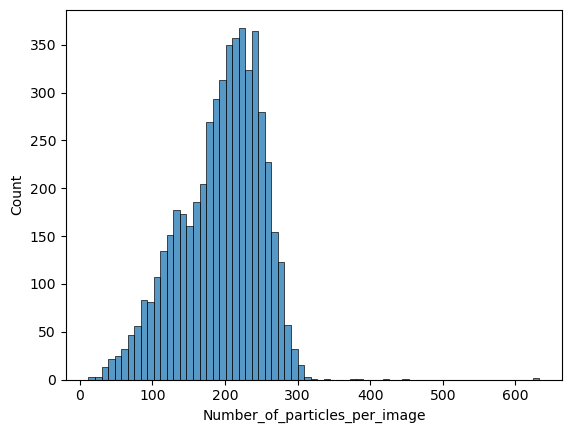

In [35]:
sns.histplot(
    data=num_particles,
    x="Number_of_particles_per_image"
)

Text(0, 0.5, 'Number of particles')

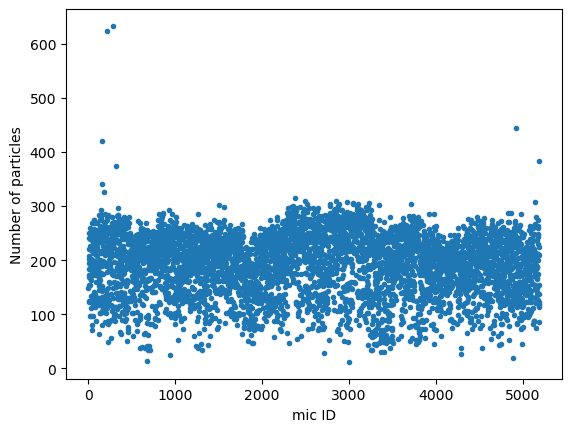

In [38]:
plt.plot(num_particles.Number_of_particles_per_image, ".")
plt.xlabel("mic ID")
plt.ylabel("Number of particles")

Show image files corresponding to very high number of particles

In [52]:
num_part_ths = 300
outlier_mics = num_particles[num_particles["Number_of_particles_per_image"] > num_part_ths]["Micrograph"]
outlier_mics

152     FoilHole_6454754_Data_6461108_6461110_20220309...
155     FoilHole_6454757_Data_6461108_6461110_20220309...
184     FoilHole_6454811_Data_6461108_6461110_20220309...
218     FoilHole_6454937_Data_6461108_6461110_20220309...
283     FoilHole_6455490_Data_6461108_6461110_20220309...
314     FoilHole_6455523_Data_6461108_6461110_20220309...
1501    FoilHole_6460195_Data_6461108_6461110_20220307...
2377    FoilHole_6463910_Data_6461108_6461110_20220308...
2493    FoilHole_6464084_Data_6461108_6461110_20220308...
2515    FoilHole_6464151_Data_6461108_6461110_20220308...
2784    FoilHole_6465585_Data_6461108_6461110_20220308...
2849    FoilHole_6465676_Data_6461108_6461110_20220308...
2881    FoilHole_6465722_Data_6461108_6461110_20220308...
2981    FoilHole_6465947_Data_6461108_6461110_20220308...
3043    FoilHole_6466552_Data_6461108_6461110_20220308...
3051    FoilHole_6466561_Data_6461108_6461110_20220308...
3101    FoilHole_6466623_Data_6461108_6461110_20220308...
3230    FoilHo

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6454754_Data_6461108_6461110_20220309_014750_fractions.mrc
152    421
Name: Number_of_particles_per_image, dtype: int64


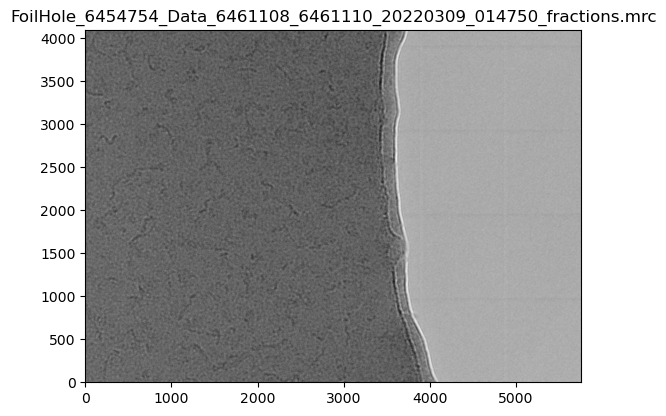

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6454757_Data_6461108_6461110_20220309_010710_fractions.mrc
155    341
Name: Number_of_particles_per_image, dtype: int64


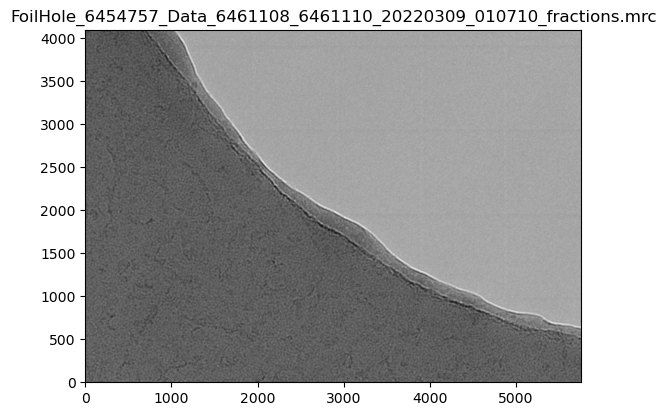

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6454811_Data_6461108_6461110_20220309_014729_fractions.mrc
184    326
Name: Number_of_particles_per_image, dtype: int64


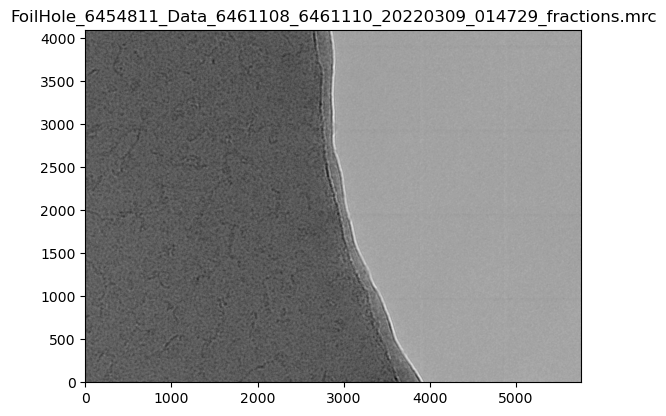

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6454937_Data_6461108_6461110_20220309_015453_fractions.mrc
218    624
Name: Number_of_particles_per_image, dtype: int64


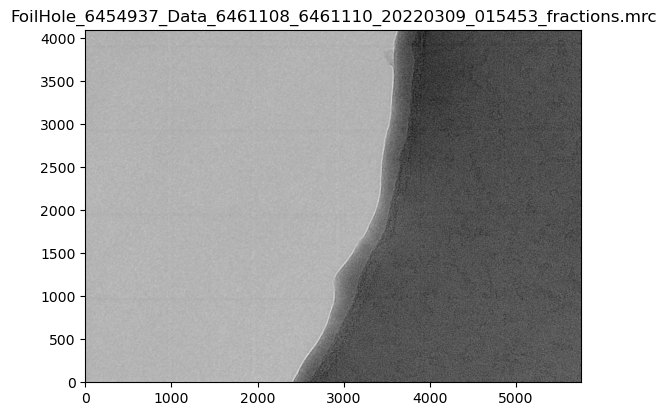

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6455490_Data_6461108_6461110_20220309_031237_fractions.mrc
283    633
Name: Number_of_particles_per_image, dtype: int64


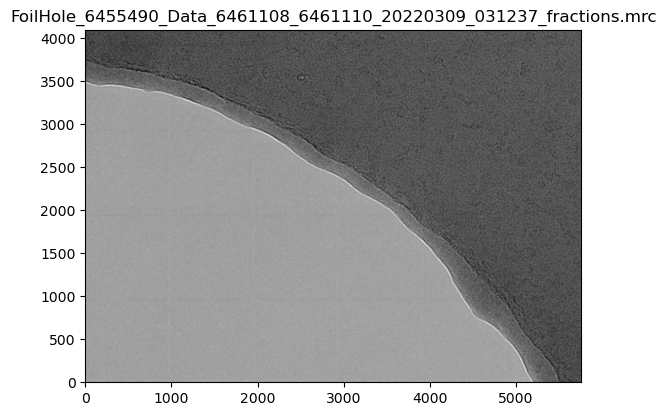

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6455523_Data_6461108_6461110_20220309_031319_fractions.mrc
314    375
Name: Number_of_particles_per_image, dtype: int64


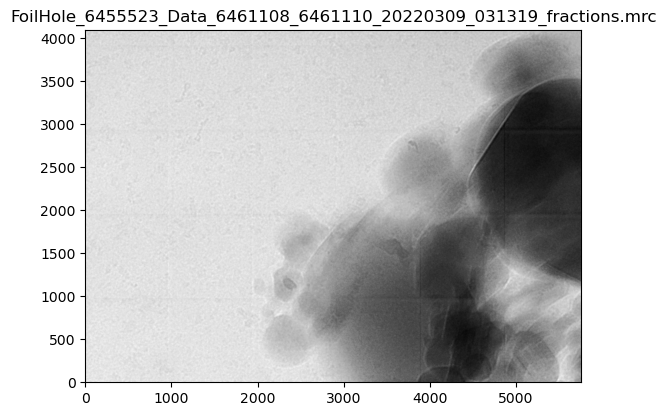

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6460195_Data_6461108_6461110_20220307_231318_fractions.mrc
1501    302
Name: Number_of_particles_per_image, dtype: int64


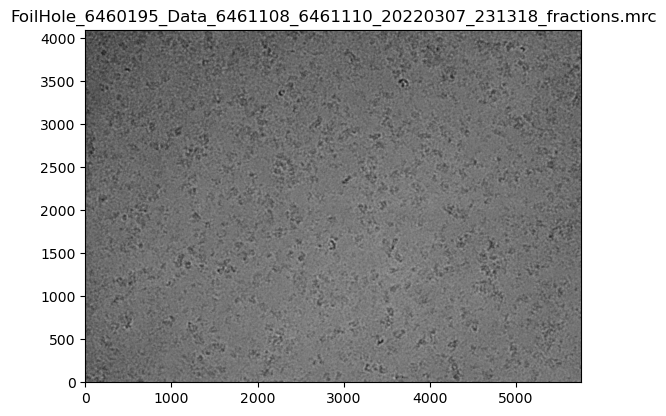

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6463910_Data_6461108_6461110_20220308_175316_fractions.mrc
2377    315
Name: Number_of_particles_per_image, dtype: int64


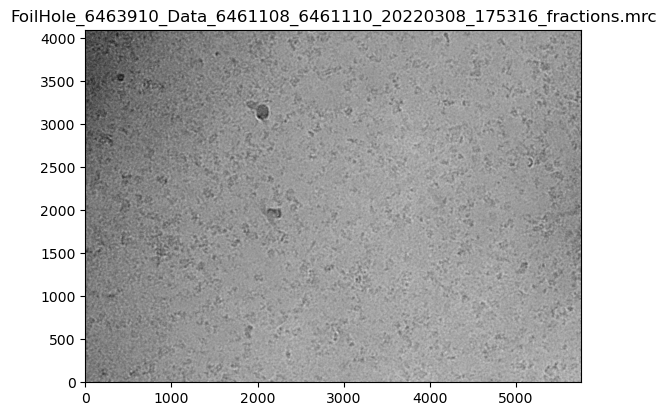

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6464084_Data_6461108_6461110_20220308_181213_fractions.mrc
2493    310
Name: Number_of_particles_per_image, dtype: int64


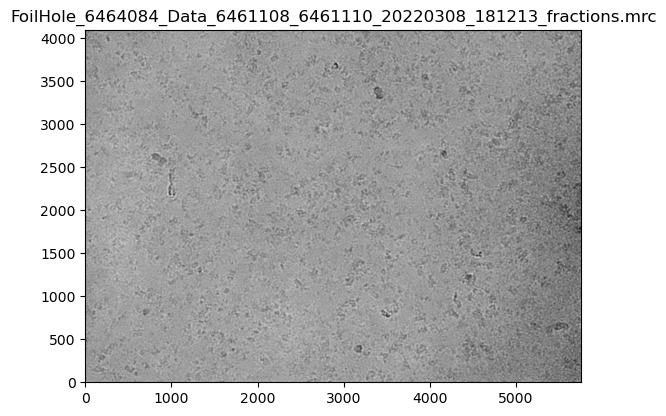

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6464151_Data_6461108_6461110_20220308_184144_fractions.mrc
2515    303
Name: Number_of_particles_per_image, dtype: int64


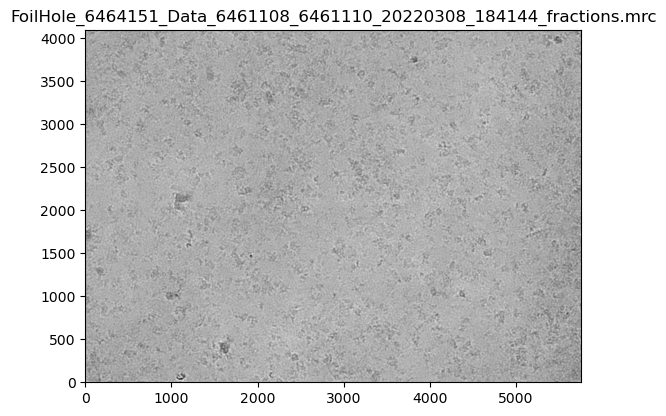

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6465585_Data_6461108_6461110_20220308_205509_fractions.mrc
2784    304
Name: Number_of_particles_per_image, dtype: int64


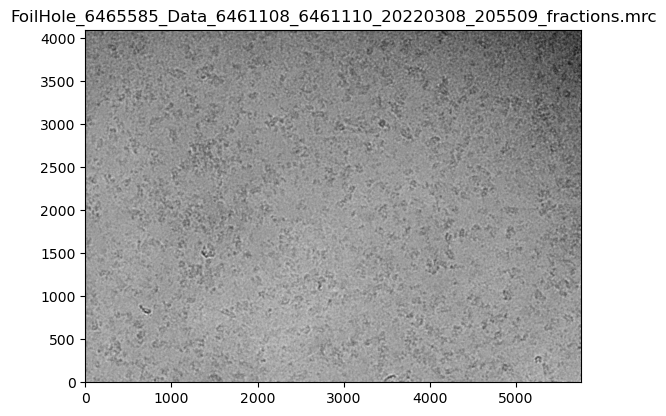

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6465676_Data_6461108_6461110_20220308_211102_fractions.mrc
2849    309
Name: Number_of_particles_per_image, dtype: int64


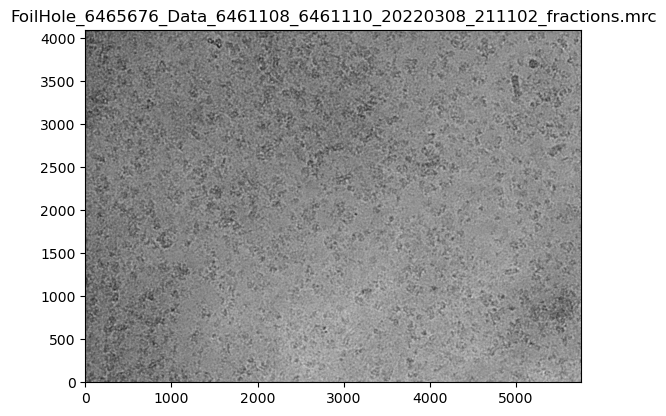

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6465722_Data_6461108_6461110_20220308_214735_fractions.mrc
2881    304
Name: Number_of_particles_per_image, dtype: int64


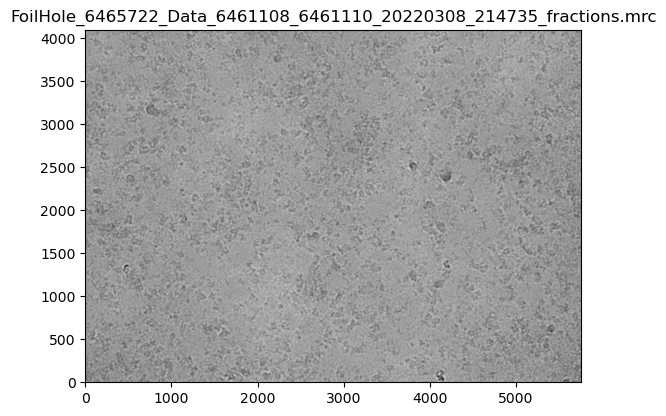

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6465947_Data_6461108_6461110_20220308_221443_fractions.mrc
2981    308
Name: Number_of_particles_per_image, dtype: int64


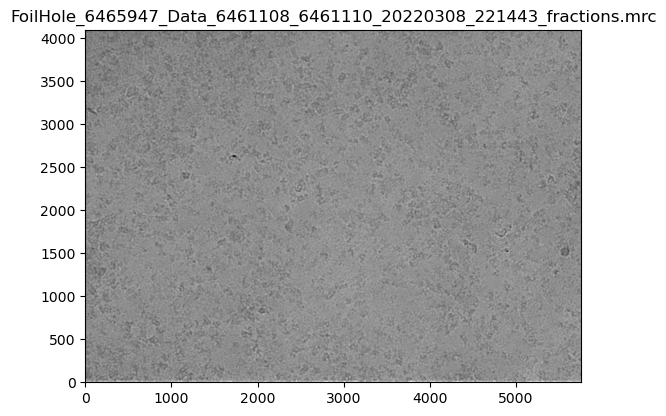

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6466552_Data_6461108_6461110_20220308_230602_fractions.mrc
3043    304
Name: Number_of_particles_per_image, dtype: int64


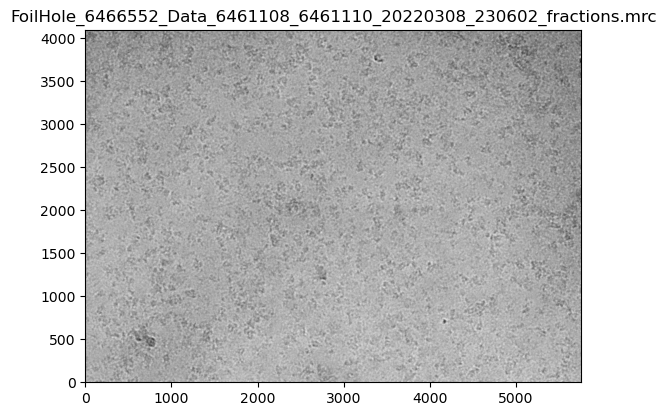

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6466561_Data_6461108_6461110_20220308_225159_fractions.mrc
3051    305
Name: Number_of_particles_per_image, dtype: int64


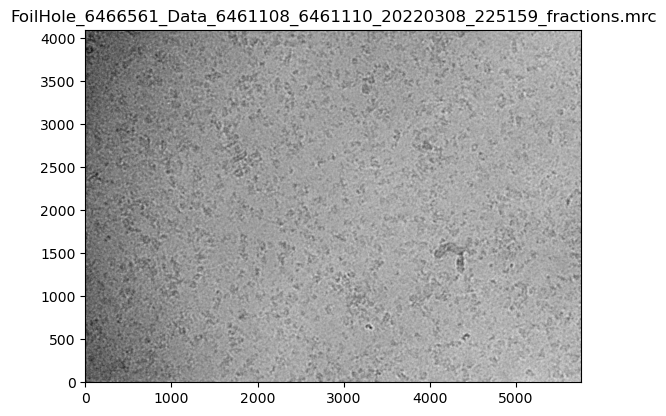

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6466623_Data_6461108_6461110_20220308_232101_fractions.mrc
3101    304
Name: Number_of_particles_per_image, dtype: int64


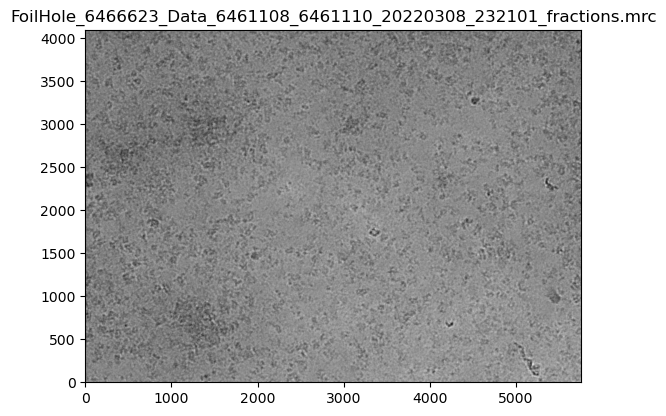

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_6466855_Data_6461108_6461110_20220309_002654_fractions.mrc
3230    306
Name: Number_of_particles_per_image, dtype: int64


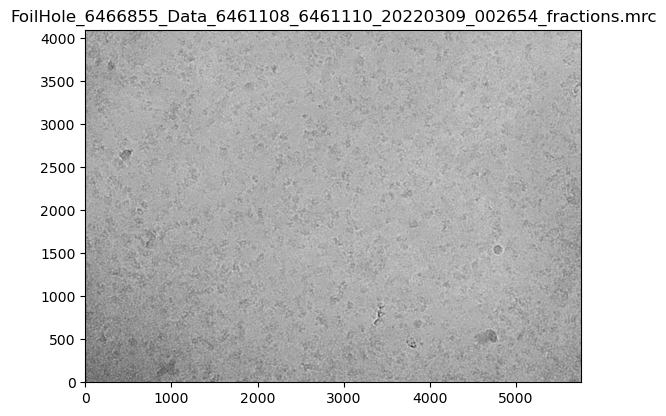

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_7494503_Data_6461108_6461110_20220309_063701_fractions.mrc
3345    302
Name: Number_of_particles_per_image, dtype: int64


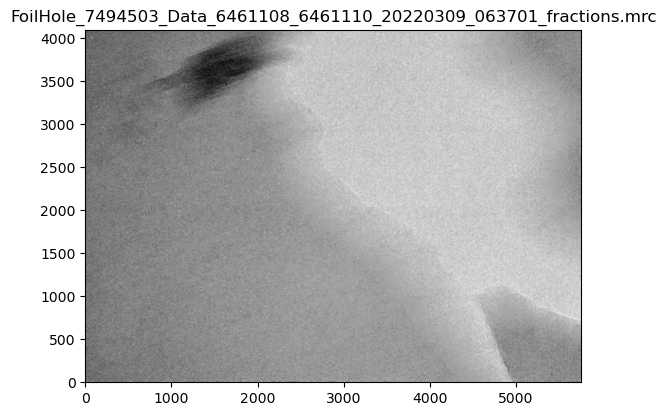

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_7495556_Data_6461108_6461110_20220309_095050_fractions.mrc
3710    304
Name: Number_of_particles_per_image, dtype: int64


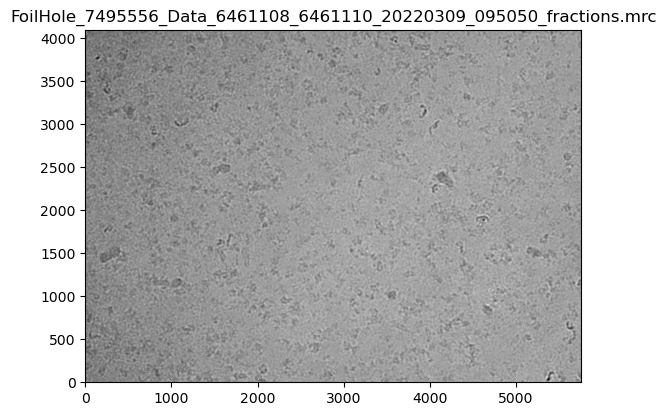

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_8534083_Data_6461108_6461110_20220309_150314_fractions.mrc
4927    444
Name: Number_of_particles_per_image, dtype: int64


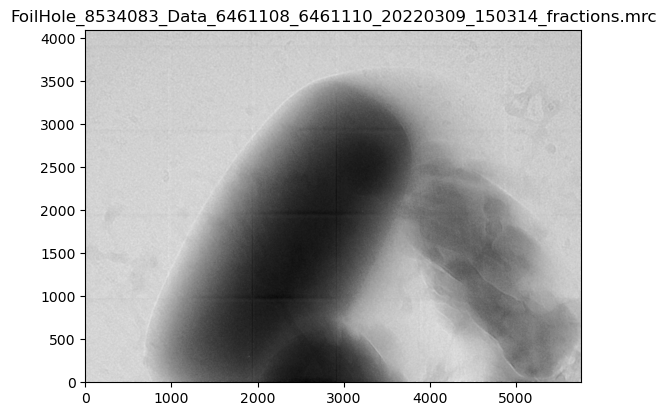

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_8535709_Data_6461108_6461110_20220309_162823_fractions.mrc
5141    308
Name: Number_of_particles_per_image, dtype: int64


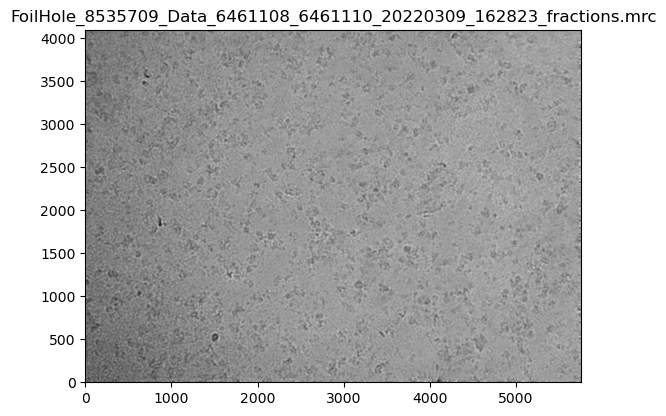

/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages/FoilHole_8535896_Data_6461108_6461110_20220309_163813_fractions.mrc
5184    384
Name: Number_of_particles_per_image, dtype: int64


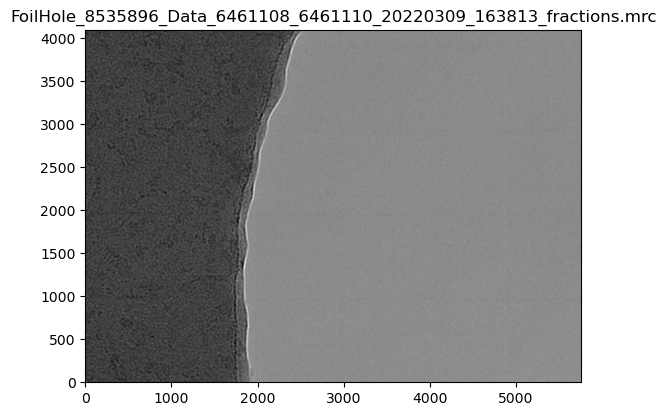

In [57]:
denoised_mics_dir_path = Path("/home/simon/gpu-rechner_u3_mount/20220307_GPCR_nanodisk_Simon/20220307_GPCR_nanodisk_Simon/janni_denoised_averages")


for f_stem in outlier_mics:
    f_path = denoised_mics_dir_path / Path(f"{f_stem}.mrc")
    assert f_path.exists() and f_path.is_file()
    print(f_path)
    print(num_particles[num_particles["Micrograph"] == f_stem]["Number_of_particles_per_image"])

    with mrcfile.open(f_path) as f:
        plt.figure()
        plt.imshow(f.data, cmap="gray", origin="lower")
        plt.title(f_path.name)
        plt.show()
    